### Visualizing the Multi Head Attention

In [3]:
# Install bertviz package
pip install bertviz

SyntaxError: invalid syntax (1972622317.py, line 2)

In [4]:
from bertviz.transformers_neuron_view import BertModel, BertTokenizer
from bertviz.neuron_view import show
import torch
import matplotlib.pyplot as plt

In [5]:
sentence_a = "The artist painted the portrait of a woman with a brush"

model_type = 'bert'
model_version = 'bert-base-uncased'
model = BertModel.from_pretrained(model_version, output_attentions = True)
tokenizer = BertTokenizer.from_pretrained(model_version, do_lower_case = True)
show(model, model_type, tokenizer, sentence_a, layer =4, head =3)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [6]:
from transformers import BertModel, BertTokenizer
from bertviz.neuron_view import show

/usr/local/python/3.12.1/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


BertSdpaSelfAttention is used but `torch.nn.functional.scaled_dot_product_attention` does not support non-absolute `position_embedding_type` or `output_attentions=True` or `head_mask`. Falling back to the manual attention implementation, but specifying the manual implementation will be required from Transformers version v5.0.0 onwards. This warning can be removed using the argument `attn_implementation="eager"` when loading the model.


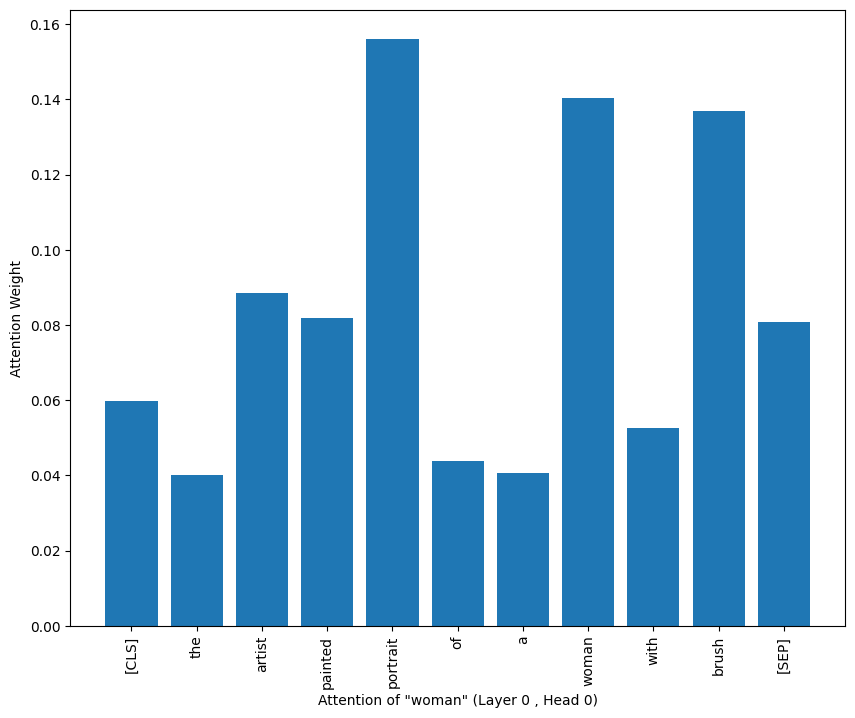

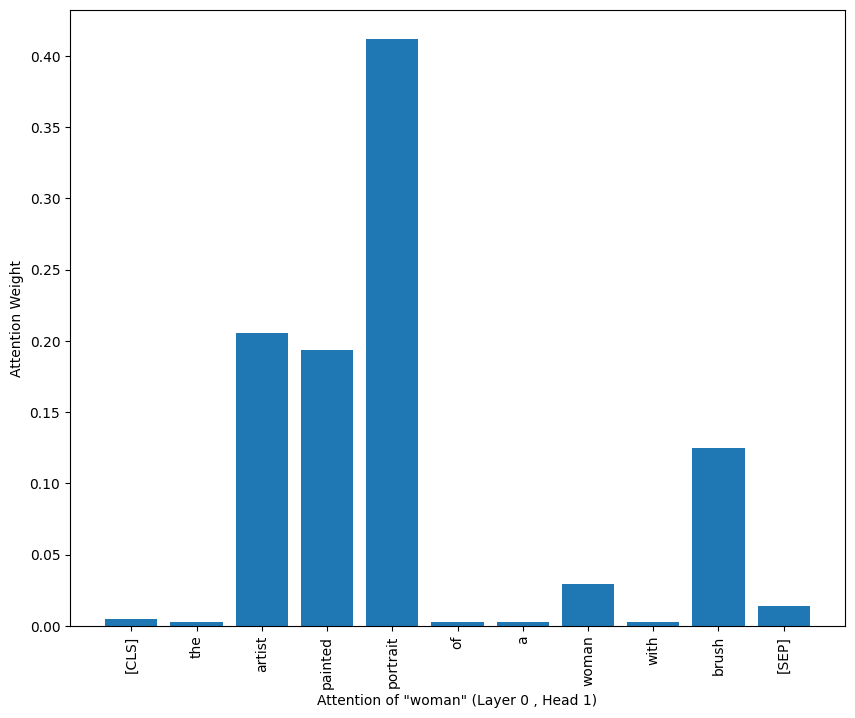

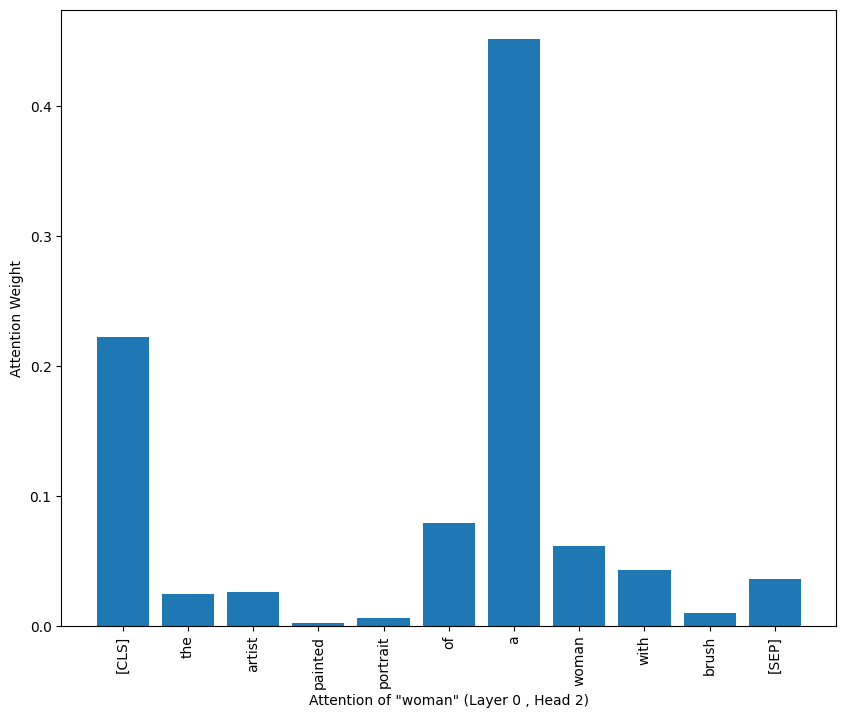

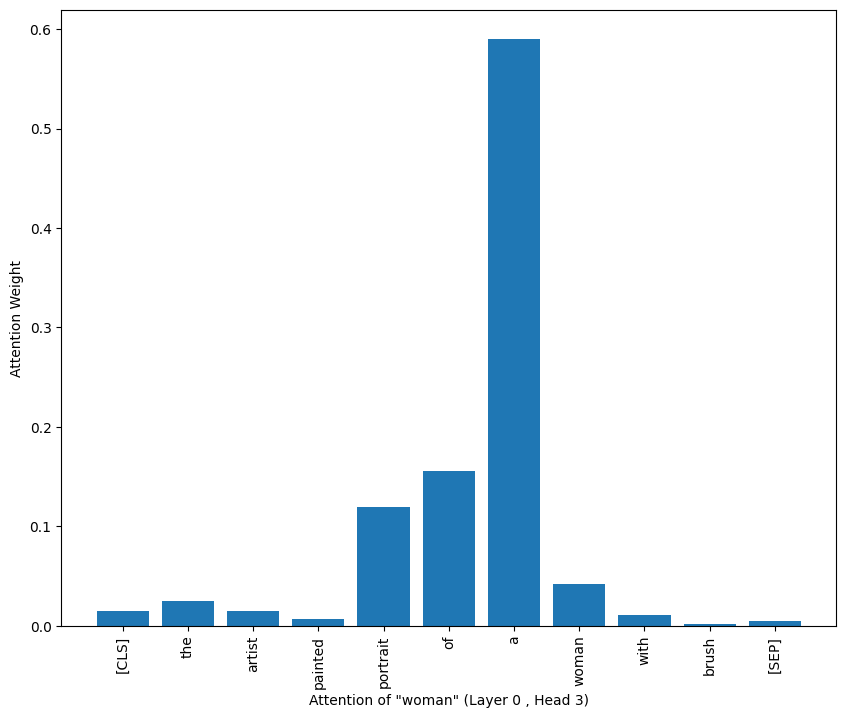

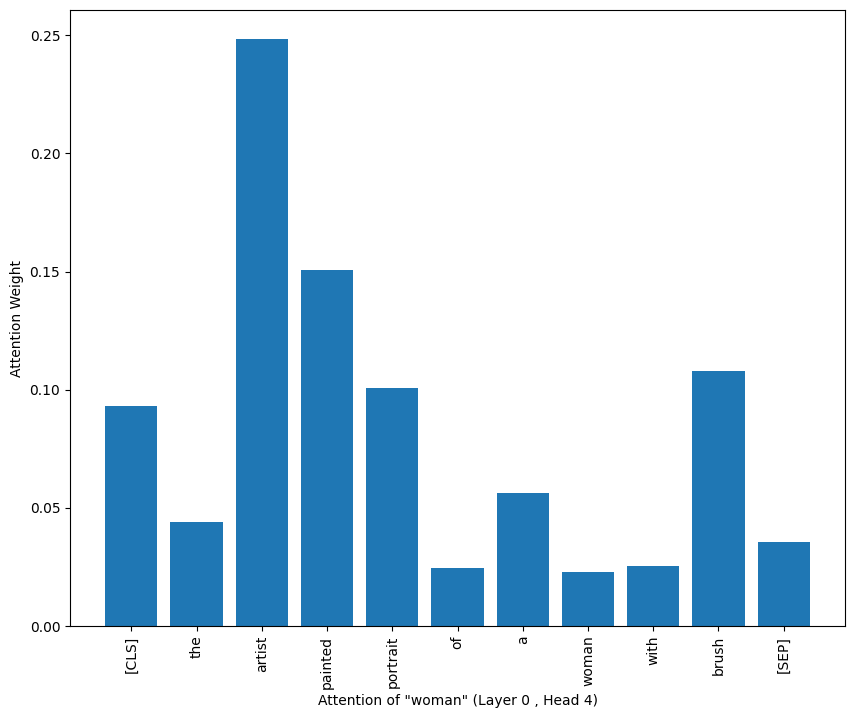

...

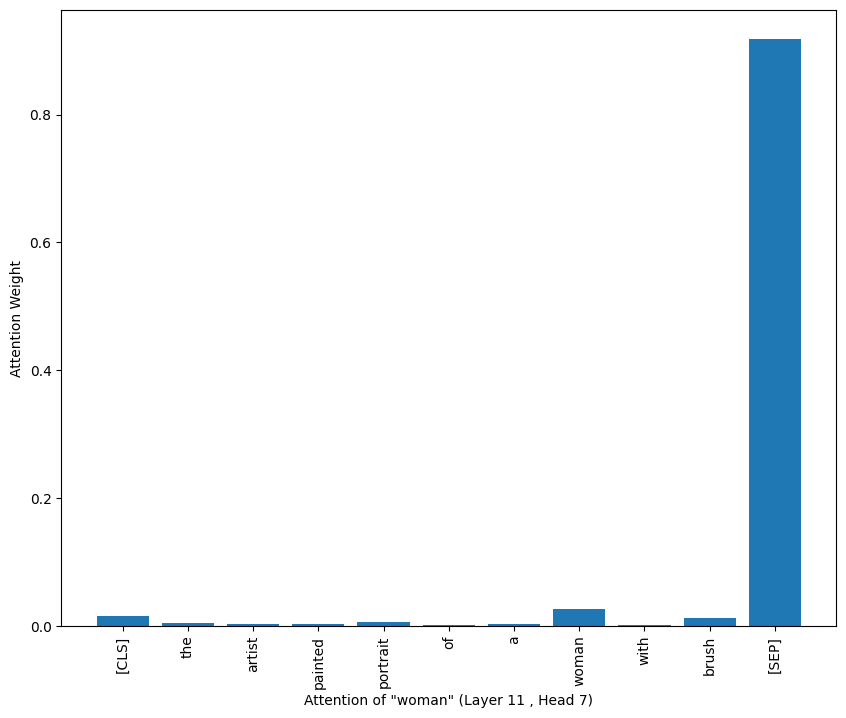

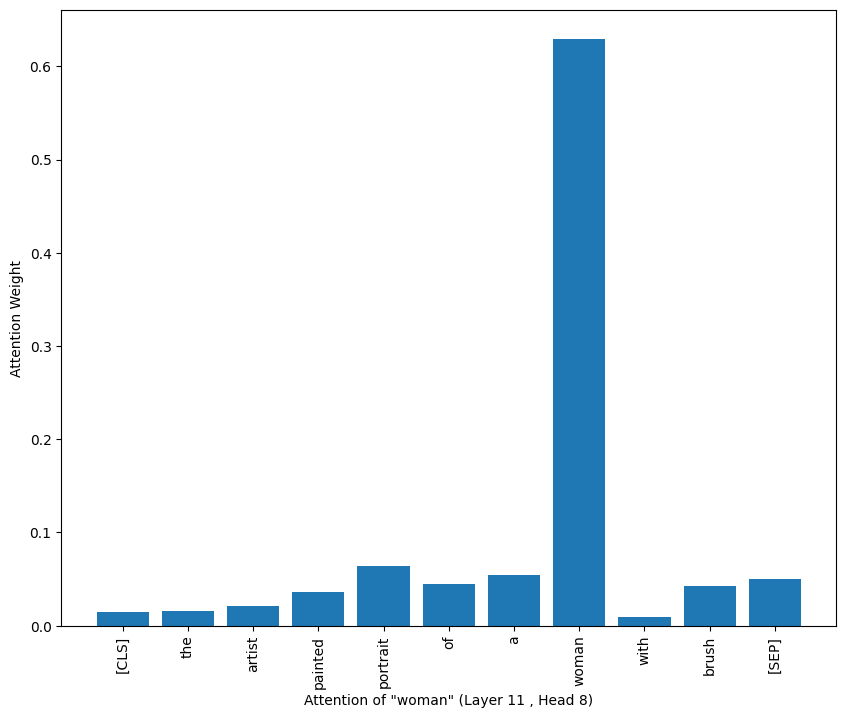

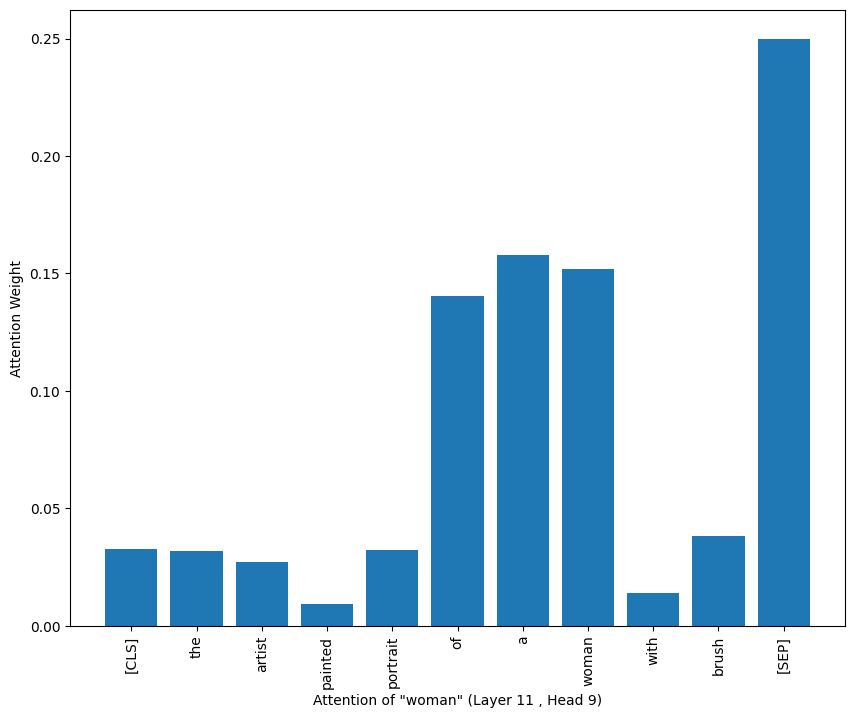

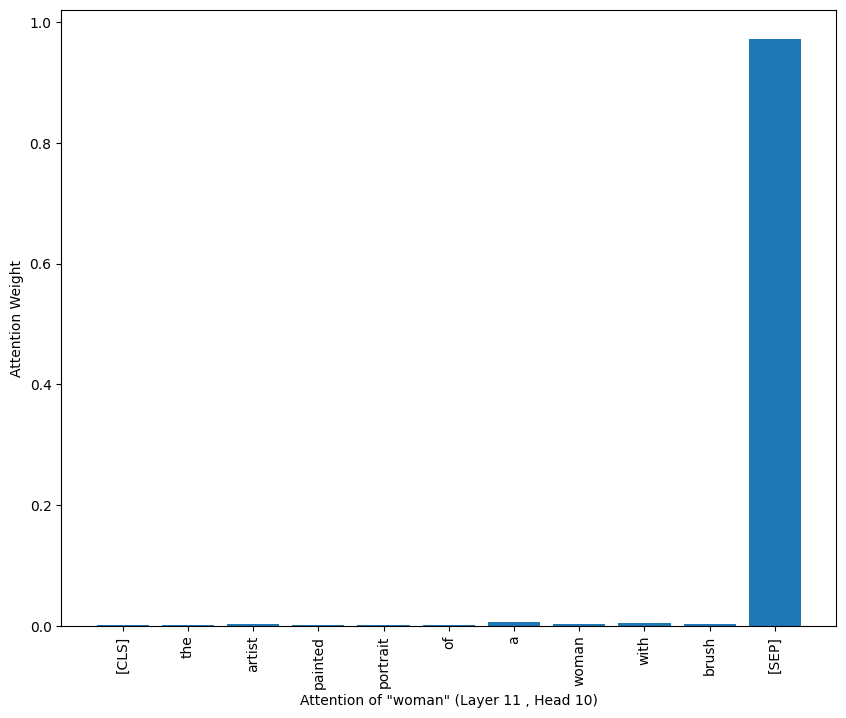

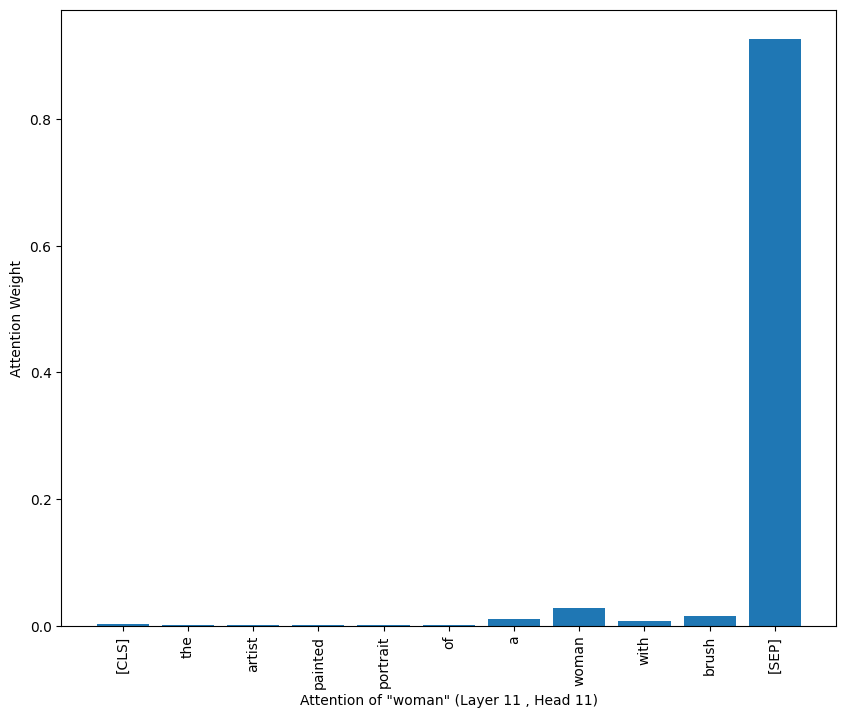

In [7]:
# Load the pre-trained model
model_name  = 'bert-base-uncased'
tokenizer = BertTokenizer.from_pretrained(model_name)
model = BertModel.from_pretrained(model_name, output_attentions = True)

# Example sentence
sentence = "The artist painted the portrait of a woman with a brush"

# # Tokenize the input sentence
inputs = tokenizer(sentence, return_tensors='pt')
tokens = tokenizer.tokenize(sentence)
tokens = ['[CLS]'] + tokens + ['[SEP]'] # Add special tokens

# Finding the index of woman
woman_index = tokens.index('woman')

# Doing forward pass to get outputs and attention weights
outputs = model(**inputs, output_attentions = True)
attentions = outputs.attentions #List of attention layers (one for each layer)

# Function to visualise the attention for the token "woman"
def visualize_attention_for_woman(layer_idx, head_idx):
    # Get the attention weights for the given layer and head
    attention_weights = attentions[layer_idx][0, head_idx].detach().numpy()

    # Get the attention values where "woman" is gicing attention to other tokens
    woman_attention = attention_weights[woman_index]

    # plot the attention map for the "woman" token
    plt.figure(figsize = (10,8))
    plt.bar(tokens, woman_attention)
    plt.xticks(rotation = 90)
    plt.ylabel('Attention Weight')
    plt.xlabel(f'Attention of "woman" (Layer {layer_idx} , Head {head_idx})')
    plt.show()

# Iterate over all the layers and heads to visualize the attention of "woman"
for layer_idx in range(len(attentions)): #looping through the layer
    for head_idx in range(attentions[layer_idx].size(1)): #looping through each head in the layer
        visualize_attention_for_woman(layer_idx, head_idx)

# Look for layer 3 and head 3. layer 3 and head 8
# Each attention head uncover different meaning 

In [8]:
attentions

(tensor([[[[4.2716e-02, 9.6987e-02, 1.7301e-02,  ..., 1.2738e-01,
            2.7403e-02, 2.0464e-01],
           [8.2619e-02, 8.8408e-02, 3.9339e-02,  ..., 7.9606e-02,
            6.2637e-02, 7.9507e-02],
           [6.8125e-02, 3.5074e-02, 8.6408e-02,  ..., 3.4751e-02,
            1.1221e-01, 8.5911e-02],
           ...,
           [7.9472e-02, 8.4913e-02, 6.3468e-02,  ..., 7.0374e-02,
            1.0050e-01, 5.2703e-02],
           [5.3436e-02, 4.1390e-02, 8.8168e-02,  ..., 3.9753e-02,
            5.0072e-02, 4.3294e-02],
           [7.8332e-02, 8.5680e-02, 3.4003e-02,  ..., 1.2196e-01,
            4.2270e-02, 1.1453e-01]],
 
          [[3.9360e-01, 9.7657e-03, 9.5957e-03,  ..., 8.8116e-03,
            1.9447e-03, 4.2585e-03],
           [4.7797e-02, 6.3172e-02, 9.3616e-02,  ..., 7.0570e-02,
            4.3629e-02, 4.8015e-02],
           [5.2560e-03, 1.9870e-02, 4.3394e-02,  ..., 1.9617e-02,
            2.6012e-02, 4.1418e-02],
           ...,
           [1.4947e-02, 6.8420e-02, 8.

In [9]:
tokens

['[CLS]',
 'the',
 'artist',
 'painted',
 'the',
 'portrait',
 'of',
 'a',
 'woman',
 'with',
 'a',
 'brush',
 '[SEP]']